## **Random Forest**

##Explicação do modelo

O modelo random forest cria várias árvores de decisão em que cada uma diferente, porque é treinada com partes diferentes dos dados e usando escolhas aleatórias, depois cada árvore da um palpite e depois o modelo combina os palpites de todas as árvores.

# Importar as bibliotecas e funções

In [2]:
import sklearn as sk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report # type: ignore
from sklearn import tree
from yellowbrick.classifier import ConfusionMatrix # type: ignore
from sklearn.tree import DecisionTreeClassifier

In [45]:
from sklearn.model_selection import GridSearchCV, train_test_split


# Ler a base

In [5]:
df = pd.read_csv('Filtragem.csv')
df

,Id,Idade,Faixa idade,Gênero,Cor/raca/etnia,PCD,Vive no Brasil,Estado onde mora,UF onde mora,Região onde Mora,...,Qual sua situação atual de trabalho?,Setor,Numero de Funcionários,Cargo Atual,Nível,Faixa salarial,Quanto tempo de experiência na área de dados você tem?,Quanto tempo de experiência na área de TI/Engenharia de Software você teve antes de começar a trabalhar na área de dados?,Qual o número aproximado de pessoas que atuam com dados na sua empresa hoje?,Existe faculdade no Estado
0,001b2d1qtli8t9z7oqgdhj001b2d4i0g,31,3,0,1,0,1,Minas Gerais (MG),9,Sudeste,...,Empregado (CLT),4,Acima de 3.000,3,2,4,4,2,0,1
1,0026aa3fwd78u0026asg7456tfkjg2cs,30,3,0,1,0,1,Espírito Santo (ES),6,Sudeste,...,Empreendedor ou Empregado (CNPJ),4,de 101 a 500,0,1,12,4,4,0,0
2,00r21rb9pusd1b0v7ew00r21rw3dy69w,37,4,1,0,0,1,São Paulo (SP),23,Sudeste,...,Empregado (CLT),4,Acima de 3.000,1,0,12,3,1,0,1
3,00v0az4g792svil00vn6y1kfm9hq8vy9,34,3,0,1,0,1,Minas Gerais (MG),9,Sudeste,...,Empreendedor ou Empregado (CNPJ),8,de 101 a 500,1,0,11,1,1,0,1
4,015qqbrh4rr015qje9gvkbsb7ti1n5df,30,3,0,1,0,1,Rio de Janeiro (RJ),17,Sudeste,...,Empreendedor ou Empregado (CNPJ),16,de 51 a 100,6,1,13,3,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2902,zwm2c16e32000c6iaswzwm2c1jv6swo0,36,4,1,4,0,1,São Paulo (SP),23,Sudeste,...,Empregado (CLT),19,de 101 a 500,1,1,12,4,2,0,1
2903,zws1zie6ro3he9ln337yufzws1zyj7nw,23,1,0,4,0,1,Goiás (GO),7,Centro-oeste,...,Empregado (CLT),18,de 51 a 100,1,0,9,1,4,0,0
2904,zxvrsh0xk8z95k76e63zxvrshjgyigq0,27,2,1,4,0,1,Espírito Santo (ES),6,Sudeste,...,Empregado (CLT),18,Acima de 3.000,5,1,13,4,2,0,0
2905,zy7hsey7pigk6d4a4zy7hsm7bh1vcozc,28,2,0,1,0,1,São Paulo (SP),23,Sudeste,...,Empregado (CLT),4,de 501 a 1.000,3,0,13,3,2,0,1


In [6]:
df.dtypes

,0
Id,object
Idade,int64
Faixa idade,int64
Gênero,int64
Cor/raca/etnia,int64
PCD,int64
Vive no Brasil,int64
Estado onde mora,object
UF onde mora,int64
Região onde Mora,object


## Retiração das colunas Região e Estado onde mora


In [7]:
df = df.drop(['Região onde Mora'], axis = 'columns')
df = df.drop(['Estado onde mora'], axis = 'columns')

## Dropando coluna inútil

In [8]:
df = df.drop(['Qual o número aproximado de pessoas que atuam com dados na sua empresa hoje?'], axis = 'columns')
df = df.drop(['Numero de Funcionários'], axis = 'columns')
df = df.drop(['Qual sua situação atual de trabalho?'], axis = 'columns')
df = df.drop(['Id'], axis = 'columns')

## Transformação dos gêneros em 0s e 1s

Masculino == 0
Feminino == 1

In [9]:
df['Gênero'] = df['Gênero'].replace({'Masculino': 0, 'Feminino': 1})
df['Gênero'] = df['Gênero'].replace({'Outro': 0, 'Prefiro não informar': 0})

## Transformação dos dados em ordem alfabética

In [10]:
df['Faixa idade'] = LabelEncoder().fit_transform(df['Faixa idade'])
df['UF onde mora'] = LabelEncoder().fit_transform(df['UF onde mora'])
df['Área de Formação'] = LabelEncoder().fit_transform(df['Área de Formação'])
df['Setor'] = LabelEncoder().fit_transform(df['Setor'])
df['Cargo Atual'] = LabelEncoder().fit_transform(df['Cargo Atual'])
df['Faixa salarial'] = LabelEncoder().fit_transform(df['Faixa salarial'])
df['Quanto tempo de experiência na área de dados você tem?'] = LabelEncoder().fit_transform(df['Quanto tempo de experiência na área de dados você tem?'])
df['Quanto tempo de experiência na área de TI/Engenharia de Software você teve antes de começar a trabalhar na área de dados?'] = LabelEncoder().fit_transform(df['Quanto tempo de experiência na área de TI/Engenharia de Software você teve antes de começar a trabalhar na área de dados?'])
df['Cor/raca/etnia'] = LabelEncoder().fit_transform(df['Cor/raca/etnia'])


##Transformando o Nível de Ensino em números crescentes



*   Estudante - 0
*   Graduação - 1
*   Pós - 2
*   Mest - 3
*   Dout - 4

In [11]:
df['Nível de Ensino'] = df['Nível de Ensino'].replace({'Estudante de Graduação': 0, 'Graduação/Bacharelado': 1, 'Pós-graduação': 2, 'Mestrado': 3, 'Doutorado ou Phd': 4})

## Transformando o Nível em números crescentes


*   Junior - 0
*   Pleno - 1
*   Senior - 2




In [12]:
df['Nível'] = df['Nível'].replace({'Júnior': 0, 'Pleno': 1, 'Sênior': 2})

In [13]:
df

,Idade,Faixa idade,Gênero,Cor/raca/etnia,PCD,Vive no Brasil,UF onde mora,Nível de Ensino,Área de Formação,Setor,Cargo Atual,Nível,Faixa salarial,Quanto tempo de experiência na área de dados você tem?,Quanto tempo de experiência na área de TI/Engenharia de Software você teve antes de começar a trabalhar na área de dados?,Existe faculdade no Estado
0,31,3,0,1,0,1,9,4,2,4,3,2,4,4,2,1
1,30,3,0,1,0,1,6,1,2,4,0,1,12,4,4,0
2,37,4,1,0,0,1,23,1,2,4,1,0,12,3,1,1
3,34,3,0,1,0,1,9,4,3,8,1,0,11,1,1,1
4,30,3,0,1,0,1,17,0,2,16,6,1,13,3,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2902,36,4,1,4,0,1,23,2,3,19,1,1,12,4,2,1
2903,23,1,0,4,0,1,7,1,2,18,1,0,9,1,4,0
2904,27,2,1,4,0,1,6,1,7,18,5,1,13,4,2,0
2905,28,2,0,1,0,1,23,1,8,4,3,0,13,3,2,1


In [14]:
df.dtypes

,0
Idade,int64
Faixa idade,int64
Gênero,int64
Cor/raca/etnia,int64
PCD,int64
Vive no Brasil,int64
UF onde mora,int64
Nível de Ensino,int64
Área de Formação,int64
Setor,int64


## Separação em X e Y

In [86]:

# Separação em X e Y
X_treino, X_teste, y_treino, y_teste = train_test_split(
    df.drop(columns=['Nível']), df['Nível'], test_size=0.25, random_state=42)

# Grade de hiperparâmetros
param_grid = {
    'n_estimators': [10, 20, 50],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 20],
    'min_impurity_decrease': [0.0, 0.001],
    'ccp_alpha': [0.0, 0.01]
}

# Modelo base
clf = RandomForestClassifier(random_state=42)

# Grid Search com validação cruzada
grid_search = GridSearchCV(estimator=clf,
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=5,
                           n_jobs=-1)

# Treinamento com Grid Search
grid_search.fit(X_treino, y_treino)

# Melhor modelo encontrado
melhor_modelo = grid_search.best_estimator_


In [87]:

# Previsões
previsoesTreino = melhor_modelo.predict(X_treino)
previsoesTeste = melhor_modelo.predict(X_teste)


## Precisao Treino


In [88]:
# Avaliação treino
print("Acurácia Treino:", accuracy_score(y_treino, previsoesTreino))

print("\nRelatório de Classificação (Treino):")
print(classification_report(y_treino, previsoesTreino))


Acurácia Treino: 0.9211009174311927

Relatório de Classificação (Treino):
              precision    recall  f1-score   support

           0       0.94      0.93      0.93       591
           1       0.90      0.88      0.89       801
           2       0.92      0.95      0.94       788

    accuracy                           0.92      2180
   macro avg       0.92      0.92      0.92      2180
weighted avg       0.92      0.92      0.92      2180



In [89]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report # type: ignore
accuracy_score(y_treino,previsoesTreino)

0.9211009174311927

## Precisao Teste


In [90]:

print("Acurácia Teste:", accuracy_score(y_teste, previsoesTeste))

print("\nRelatório de Classificação (Teste):")
print(classification_report(y_teste, previsoesTeste))


Acurácia Teste: 0.6960110041265475

Relatório de Classificação (Teste):
              precision    recall  f1-score   support

           0       0.74      0.73      0.73       171
           1       0.61      0.62      0.62       280
           2       0.75      0.76      0.75       276

    accuracy                           0.70       727
   macro avg       0.70      0.70      0.70       727
weighted avg       0.70      0.70      0.70       727



In [91]:
accuracy_score(y_teste,previsoesTeste)

0.6960110041265475

## Importance

In [92]:


# Importância das features
importancias = melhor_modelo.feature_importances_
df_importancia = pd.DataFrame({
    'Feature': X_treino.columns,
    'Importância': importancias
}).sort_values(by='Importância', ascending=False)

print("\nImportância das Features:")
print(df_importancia)



Importância das Features:
                                              Feature  Importância
12  Quanto tempo de experiência na área de dados v...     0.253938
11                                     Faixa salarial     0.199118
0                                               Idade     0.101530
9                                               Setor     0.063116
7                                     Nível de Ensino     0.061412
13  Quanto tempo de experiência na área de TI/Enge...     0.056432
1                                         Faixa idade     0.055060
10                                        Cargo Atual     0.053853
6                                        UF onde mora     0.048257
8                                    Área de Formação     0.044794
3                                      Cor/raca/etnia     0.027840
14                         Existe faculdade no Estado     0.015058
2                                              Gênero     0.014791
4                                  

##Grafico de regras

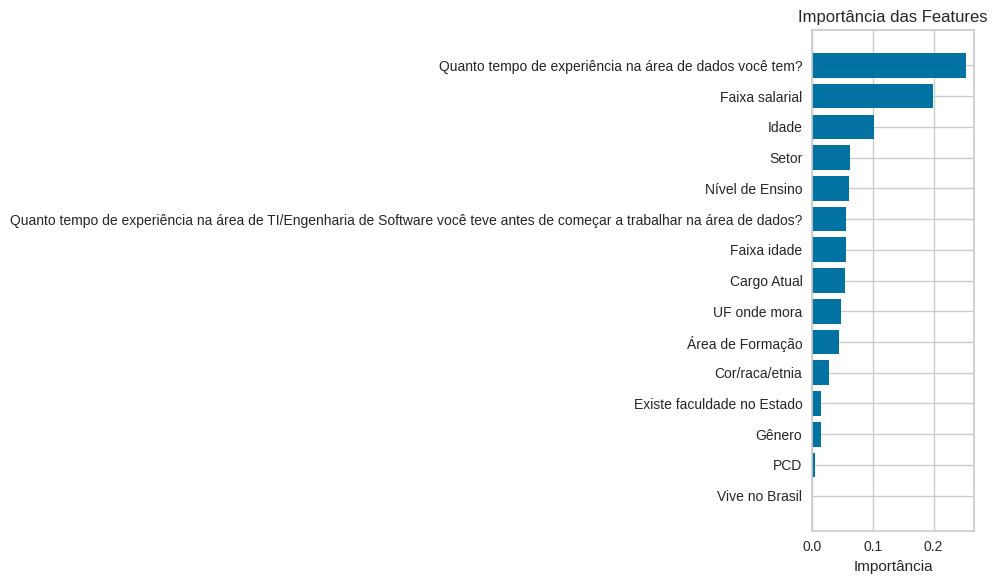

In [93]:

plt.figure(figsize=(10, 6))
plt.barh(df_importancia['Feature'], df_importancia['Importância'])
plt.gca().invert_yaxis()
plt.title("Importância das Features")
plt.xlabel("Importância")
plt.tight_layout()
plt.show()

## Matriz Treino

In [94]:
print("\nMatriz de Confusão (Treino):")
print(confusion_matrix(y_treino, previsoesTreino))


Matriz de Confusão (Treino):
[[548  42   1]
 [ 33 708  60]
 [  1  35 752]]


## Matriz Teste

In [95]:
print("\nMatriz de Confusão (Teste):")
print(confusion_matrix(y_teste, previsoesTeste))


Matriz de Confusão (Teste):
[[124  44   3]
 [ 41 173  66]
 [  2  65 209]]


## Visualização de Acertos do Treino


*   0 = Junior
*   1 = Pleno
*   2 = Senior

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


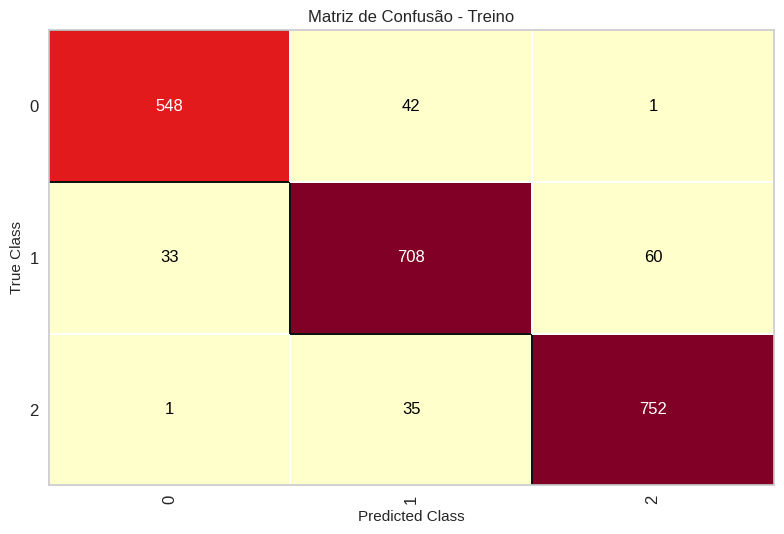

<Axes: title={'center': 'Matriz de Confusão - Treino'}, xlabel='Predicted Class', ylabel='True Class'>

In [96]:

# Criação do visualizador
cm_treino = ConfusionMatrix(melhor_modelo, title="Matriz de Confusão - Treino")

# Treina com dados de treino
cm_treino.fit(X_treino, y_treino)

# Avalia com os mesmos dados (treino)
cm_treino.score(X_treino, y_treino)

# Exibe o gráfico
cm_treino.show()


## Visualização de Acertos do Teste



*   0 = Junior
*   1 = Pleno
*   2 = Senior

/usr/local/lib/python3.11/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


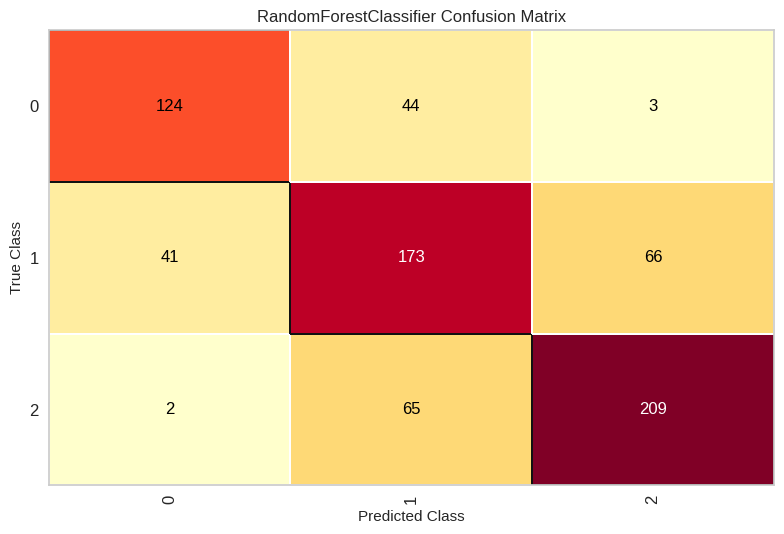

<Axes: title={'center': 'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [97]:

# Visualização da matriz de confusão no teste
cm = ConfusionMatrix(melhor_modelo)


# Avalia o desempenho no conjunto de teste e exibe a matriz
cm.score(X_teste, y_teste)
cm.show()  # Necessário em notebooks/Colab


## Precision Treino

In [98]:
print(classification_report(y_treino, previsoesTreino))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93       591
           1       0.90      0.88      0.89       801
           2       0.92      0.95      0.94       788

    accuracy                           0.92      2180
   macro avg       0.92      0.92      0.92      2180
weighted avg       0.92      0.92      0.92      2180



## Precision Teste

In [99]:
print(classification_report(y_teste, previsoesTeste))

              precision    recall  f1-score   support

           0       0.74      0.73      0.73       171
           1       0.61      0.62      0.62       280
           2       0.75      0.76      0.75       276

    accuracy                           0.70       727
   macro avg       0.70      0.70      0.70       727
weighted avg       0.70      0.70      0.70       727



In [101]:
from sklearn.tree import export_graphviz
import graphviz
from IPython.display import Image, display

# Seleciona uma das árvores da floresta aleatória
melhor_estimador = melhor_modelo.estimators_[0]

# Exporta a árvore para o formato DOT com opções padrão
dot_data = export_graphviz(
    melhor_estimador,
    feature_names=X_treino.columns,
    class_names=['0', '1', '2'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Adiciona manualmente atributos globais com alta resolução e espaço ampliado
dot_data_modificado = 'digraph Tree {\n' + \
    'graph [dpi=600, size="80,80!", ratio=compress];\n' + \
    dot_data.split('\n', 1)[1]  # substitui o cabeçalho original

# Gera imagem em PNG de alta qualidade
graph = graphviz.Source(dot_data_modificado)
graph.format = 'png'
output_path = "modelo_arvore_legivel_final="
graph.render(output_path, cleanup=True)

# Exibe o PNG no notebook
display(Image(filename=output_path + ".png"))


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.682646 to fit


In [ ]:
from google.colab import files
df.to_csv('Filtragem_Transformada.csv', index=False)  # Salva o DataFrame modificado
files.download('Filtragem_Transformada.csv')          # Faz o download do arquivo atualizado

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>